# Importing Useful Libraries

In [1]:
from statsmodels.graphics.regressionplots import influence_plot
import statsmodels.formula.api as smf
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Reading Data From CSV File

In [3]:
df = pd.read_csv('bank-full.csv', sep = ';')

In [4]:
df.head(45211)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [5]:
print(df.shape)

(45211, 17)


In [6]:
df.drop('balance', axis = 1, inplace = True)

In [7]:
df.drop('duration', axis = 1, inplace = True)

In [8]:
df.head()

,age,job,marital,education,default,housing,loan,contact,day,month,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,yes,no,unknown,5,may,1,-1,0,unknown,no
1,44,technician,single,secondary,no,yes,no,unknown,5,may,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,yes,yes,unknown,5,may,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,yes,no,unknown,5,may,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,no,no,unknown,5,may,1,-1,0,unknown,no


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   housing    45211 non-null  object
 6   loan       45211 non-null  object
 7   contact    45211 non-null  object
 8   day        45211 non-null  int64 
 9   month      45211 non-null  object
 10  campaign   45211 non-null  int64 
 11  pdays      45211 non-null  int64 
 12  previous   45211 non-null  int64 
 13  poutcome   45211 non-null  object
 14  y          45211 non-null  object
dtypes: int64(5), object(10)
memory usage: 5.2+ MB


In [10]:
df.describe()

,age,day,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,15.806419,2.763841,40.197828,0.580323
std,10.618762,8.322476,3.098021,100.128746,2.303441
min,18.000000,1.000000,1.000000,-1.000000,0.000000
25%,33.000000,8.000000,1.000000,-1.000000,0.000000
50%,39.000000,16.000000,2.000000,-1.000000,0.000000
75%,48.000000,21.000000,3.000000,-1.000000,0.000000
max,95.000000,31.000000,63.000000,871.000000,275.000000


In [11]:
df.corr()

,age,day,campaign,pdays,previous
age,1.000000,-0.009120,0.004760,-0.023758,0.001288
day,-0.009120,1.000000,0.162490,-0.093044,-0.051710
campaign,0.004760,0.162490,1.000000,-0.088628,-0.032855
pdays,-0.023758,-0.093044,-0.088628,1.000000,0.454820
previous,0.001288,-0.051710,-0.032855,0.454820,1.000000


# EDA

## Data Visualization

#### Missing Data Analysis

<AxesSubplot:>

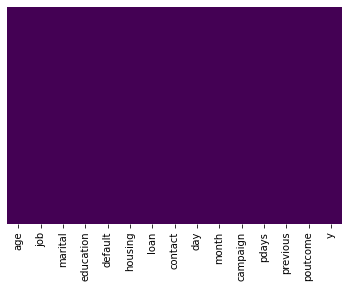

In [12]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

<AxesSubplot:xlabel='marital', ylabel='count'>

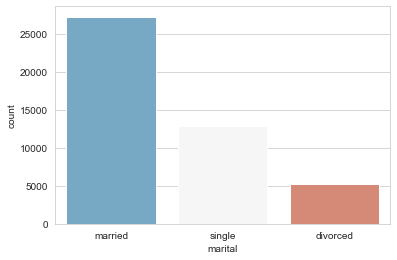

In [13]:
sns.set_style('whitegrid')
sns.countplot(x='marital',data=df,palette='RdBu_r')

<AxesSubplot:xlabel='housing', ylabel='count'>

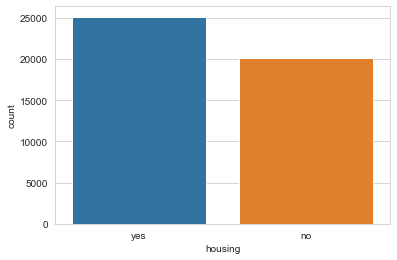

In [14]:
sns.countplot(x = 'housing', data = df)

<AxesSubplot:xlabel='month', ylabel='count'>

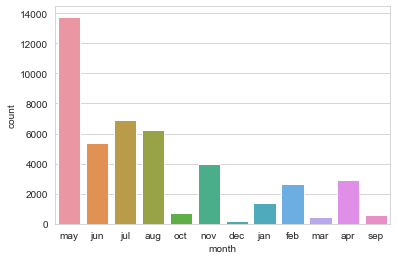

In [15]:
sns.countplot(x = 'month', data = df)

<AxesSubplot:xlabel='y', ylabel='count'>

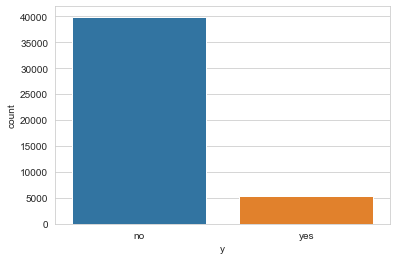

In [16]:
sns.countplot(x = 'y', data = df)

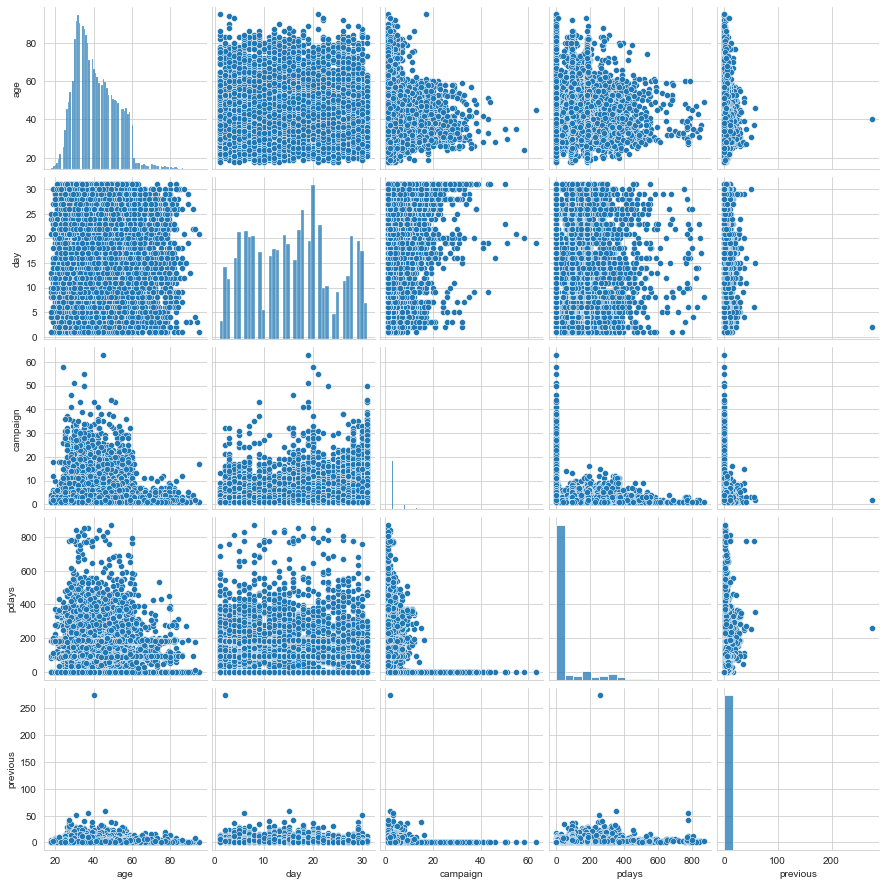

In [17]:
sns.pairplot(df)

In [18]:
import cufflinks as cf
cf.go_offline()

In [19]:
df['y'].iplot(kind='hist',bins=30,color='green')

In [20]:
df['month'].iplot(kind='hist',bins=30,color='red')

In [21]:
df['housing'].iplot(kind='hist',bins=30,color='green')

In [22]:
df['marital'].iplot(kind='hist',bins=30,color='orange')

In [23]:
df['contact'].iplot(kind='hist',bins=30,color='green')

In [24]:
df['poutcome'].iplot(kind='hist',bins=30,color='yellow')

In [25]:
df['education'].iplot(kind='hist',bins=30,color='pink')

# Training A Logistic Regression Model

 #### X And Y Arrays

In [26]:
X = df[['age', 'day','pdays', 'campaign']]

y = df['y']

# Train Test Split

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Creating And Training Model

In [29]:
from sklearn.linear_model import LogisticRegression

In [30]:
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

LogisticRegression()

In [31]:
predictions = logmodel.predict(X_test)

# Evaluation

In [32]:
from sklearn.metrics import classification_report

In [33]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

          no       0.88      1.00      0.94     13175
         yes       0.00      0.00      0.00      1745

    accuracy                           0.88     14920
   macro avg       0.44      0.50      0.47     14920
weighted avg       0.78      0.88      0.83     14920

